In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql import functions as F
from pyspark.sql.functions import col, to_date, when, countDistinct, count
from pyspark.sql.functions import split, explode, trim, col, lit, length
from pyspark.sql.functions import current_date, row_number, regexp_replace, coalesce
from pyspark.sql.functions import sum as spark_sum
from pyspark.sql.window import Window
import numpy as np

In [0]:
display(dbutils.fs.ls("dbfs:/FileStore/tables/"))


path,name,size,modificationTime
dbfs:/FileStore/tables/2025_03_11___DBFS_Example_Classifier.ipynb,2025_03_11___DBFS_Example_Classifier.ipynb,68203,1742288094000
dbfs:/FileStore/tables/Imdb_Movie_Dataset-1.csv,Imdb_Movie_Dataset-1.csv,392283051,1746882391000
dbfs:/FileStore/tables/Imdb_Movie_Dataset.csv,Imdb_Movie_Dataset.csv,392283051,1746879701000
dbfs:/FileStore/tables/archive-1.zip,archive-1.zip,160786298,1746877527000
dbfs:/FileStore/tables/archive-2.zip,archive-2.zip,160786298,1746877987000
dbfs:/FileStore/tables/archive-3.zip,archive-3.zip,160786298,1746878808000
dbfs:/FileStore/tables/archive-4.zip,archive-4.zip,160786298,1746879282000
dbfs:/FileStore/tables/archive.zip,archive.zip,160786298,1746877512000
dbfs:/FileStore/tables/df_checkpoint/,df_checkpoint/,0,0
dbfs:/FileStore/tables/imdb_movie_sample/,imdb_movie_sample/,0,0


In [0]:
# File location and type
file_location = "/FileStore/tables/Imdb_Movie_Dataset-1.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
# quote <-- Important to handle commas correctly
df = (
    spark.read.format(file_type)
    .option("inferSchema", infer_schema)
    .option("header", first_row_is_header)
    .option("sep", delimiter)
    .option("quote", '"')
    .option("escape", '"')
    .load(file_location)
)

display(df)

id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
27205,Inception,8.364,34495,Released,7/15/2010,825532764,148,false,160000000,tt1375666,en,Inception,"Cobb, a skilled thief who commits corporate espionage by infiltrating the subconscious of his targets is offered a chance to regain his old life as payment for a task considered to be impossible: ""inception"", the implantation of another person's idea into a target's subconscious.",83.952,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pictures","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, france, virtual reality, kidnapping, philosophy, spy, allegory, manipulation, car crash, heist, memory, architecture, los angeles, california, dream world, subconscious"
157336,Interstellar,8.417,32571,Released,11/5/2014,701729206,169,false,165000000,tt0816692,en,Interstellar,The adventures of a group of explorers who make use of a newly discovered wormhole to surpass the limitations on human space travel and conquer the vast distances involved in an interstellar voyage.,140.241,Mankind was born on Earth. It was never meant to die here.,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Productions","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time, artificial intelligence (a.i.), nasa, time warp, dystopia, expedition, space travel, wormhole, famine, black hole, quantum mechanics, family relationships, space, robot, astronaut, scientist, single father, farmer, space station, curious, space adventure, time paradox, thoughtful, time-manipulation, father daughter relationship, 2060s, cornfield, time manipulation, complicated"
155,The Dark Knight,8.512,30619,Released,7/16/2008,1004558444,152,false,185000000,tt0468569,en,The Dark Knight,"Batman raises the stakes in his war on crime. With the help of Lt. Jim Gordon and District Attorney Harvey Dent, Batman sets out to dismantle the remaining criminal organizations that plague the streets. The partnership proves to be effective, but they soon find themselves prey to a reign of chaos unleashed by a rising criminal mastermind known to the terrified citizens of Gotham as the Joker.",130.643,Welcome to a world without rules.,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel Griffiths, Warner Bros. Pictures","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime fighter, superhero, anti hero, scarecrow, based on comic, vigilante, organized crime, tragic hero, anti villain, criminal mastermind, district attorney, super power, super villain, neo-noir"
19995,Avatar,7.573,29815,Released,12/15/2009,2923706026,162,false,237000000,tt0499549,en,Avatar,"In the 22nd century, a paraplegic Marine is dispatched to the moon Pandora on a unique mission, but becomes torn between following orders and protecting an alien civilization.",79.932,Enter the world of Pandora.,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, 20th Century Fox, Ingenious Media","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, space war, space colony, tribe, romance, alien, futuristic, space, alien planet, marine, soldier, battle, love affair, nature, anti war, power relations, joyful"
24428,The Avengers,7.71,29166,Released,4/25/2012,1518815515,143,false,220000000,tt0848228,en,The Avengers,"When an unexpected enemy emerges and threatens global safety and security, Nick Fury, director of the international peacekeeping agency known as S.H.I.E.L.D., finds himself in need of a team to pull the world back from the brink of disast

#Data Cleaning

Can we predict the box office revenue of a movie before it is released?
This project explores that question by building a machine learning regression model using Apache Spark MLlib to predict the revenue of a movie based on features such as budget, genre, popularity, vote average, and more.


In [0]:
df.printSchema()


root
 |-- id: integer (nullable = true)
 |-- title: string (nullable = true)
 |-- vote_average: double (nullable = true)
 |-- vote_count: integer (nullable = true)
 |-- status: string (nullable = true)
 |-- release_date: string (nullable = true)
 |-- revenue: long (nullable = true)
 |-- runtime: integer (nullable = true)
 |-- adult: boolean (nullable = true)
 |-- budget: integer (nullable = true)
 |-- imdb_id: string (nullable = true)
 |-- original_language: string (nullable = true)
 |-- original_title: string (nullable = true)
 |-- overview: string (nullable = true)
 |-- popularity: double (nullable = true)
 |-- tagline: string (nullable = true)
 |-- genres: string (nullable = true)
 |-- production_companies: string (nullable = true)
 |-- production_countries: string (nullable = true)
 |-- spoken_languages: string (nullable = true)
 |-- keywords: string (nullable = true)



## Dataset Schema with Correct Types

| Column                  | Current Type | Correct Type      |
|-------------------------|--------------|-------------------|
| id                      | integer      | integer           |
| title                   | string       | string            |
| vote_average            | string       | **double** (float)|
| vote_count              | string       | **integer**       |
| status                  | string       | string            |
| release_date            | string       | **date**          |
| revenue                 | string       | **long** (integer)|
| runtime                 | string       | **integer**       |
| adult                   | string       | **boolean**       |
| budget                  | string       | **long** (integer)|
| imdb_id                 | string       | string            |
| original_language       | string       | string            |
| original_title          | string       | string            |
| overview                | string       | string            |
| popularity              | string       | **double** (float)|
| tagline                 | string       | string            |
| genres                  | string       | **array<string>** |
| production_companies    | string       | **array<string>** |
| production_countries    | string       | **array<string>** |
| spoken_languages        | string       | **array<string>** |
| keywords                | string       | **array<string>** |

In [0]:
# Function to calculate missing values by column
def missing_values_table_spark(df):

    # Calculate the total missing values for each column
    mis_val = df.select([F.sum(F.col(c).isNull().cast("int")).alias(c) for c in df.columns])

    # Convert to Pandas for easier handling
    mis_val_pd = mis_val.toPandas().transpose()

    # Calculate the percentage of missing values for each column
    mis_val_percent = (mis_val_pd[0] / df.count()) * 100

    # Create a new table combining count and percentage
    mis_val_table = pd.concat([mis_val_pd, mis_val_percent], axis=1)
    mis_val_table.columns = ['Missing Values', '% of Total Values']

    # Keep only columns with >0% missing, sort descending, round
    mis_val_table = (
        mis_val_table[mis_val_table['% of Total Values'] > 0]
        .sort_values('% of Total Values', ascending=False)
        .round(1)
    )

    # Reset index so that original column names become a column
    mis_val_table = mis_val_table.reset_index().rename(columns={'index': 'Column'})

    # Print summary
    print(f"Your selected dataframe has {len(df.columns)} columns.\n"
          f"There are {mis_val_table.shape[0]} columns that have missing values.")

    return mis_val_table

# Usage
missing_values = missing_values_table_spark(df)
display(missing_values)

Your selected dataframe has 21 columns.
There are 11 columns that have missing values.


Column,Missing Values,% of Total Values
tagline,895847,85.4
keywords,755953,72.1
production_companies,568428,54.2
imdb_id,487595,46.5
production_countries,463497,44.2
spoken_languages,440662,42.0
genres,414972,39.6
overview,215824,20.6
release_date,181817,17.3
title,13,0.0


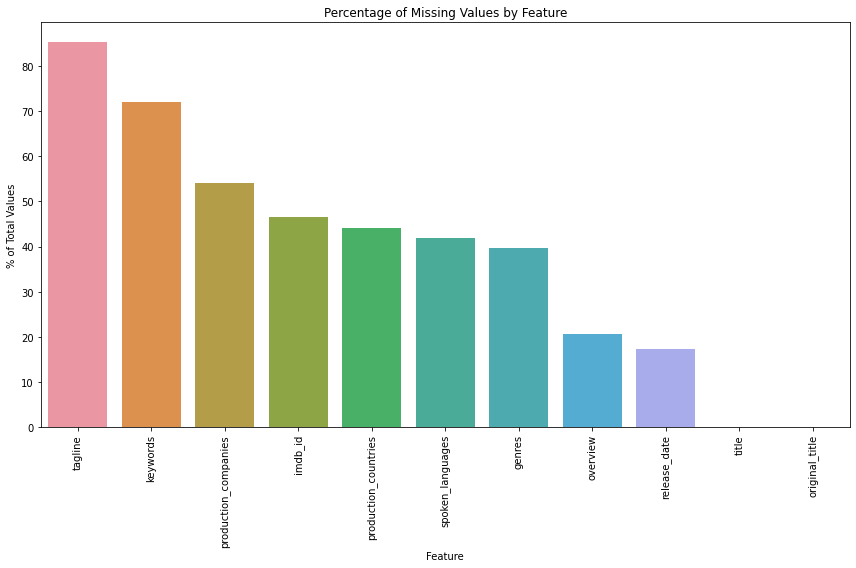

In [0]:
def plot_missing_values(mis_val_table, title):
    """
    Plots the percentage of missing values per feature, showing feature names on the x-axis.
    Assumes `mis_val_table` has a column 'Column' with the feature names and
    '% of Total Values' with the missing-value percentages.
    """
    plt.figure(figsize=(12, 8))

    # Use the 'Column' column for x-labels
    sns.barplot(
        data=mis_val_table,
        x='Column',
        y='% of Total Values'
    )

    # Rotate the x labels for better readability
    plt.xticks(rotation=90)

    # Set plot labels and title
    plt.title(title)
    plt.xlabel('Feature')
    plt.ylabel('% of Total Values')

    plt.tight_layout()
    plt.show()

# Call the function to plot the missing values with feature names shown
plot_missing_values(missing_values, title='Percentage of Missing Values by Feature')

In [0]:
# Updated function to include a 'Column' column instead of using the index
def zero_values_table_spark(df):

    # For each column, count how many values equal zero
    zero_counts = df.select([F.sum(F.when(F.col(c) == 0, 1).otherwise(0)).alias(c) for c in df.columns])

    # Convert result to Pandas for easier manipulation
    zero_counts_pd = zero_counts.toPandas().transpose()

    # Compute percentage
    row_count = df.count()
    zero_percent = (zero_counts_pd[0] / row_count) * 100

    # Create summary table
    zero_table = pd.concat([zero_counts_pd, zero_percent], axis=1)
    zero_table.columns = ['Zero Values', '% of Total Values']

    # Keep only columns with zeros, sort and round
    zero_table = (
        zero_table[zero_table['Zero Values'] > 0]
        .sort_values('% of Total Values', ascending=False)
        .round(1)
    )

    # Reset index so column names appear as a column
    zero_table = zero_table.reset_index().rename(columns={'index': 'Column'})

    # Print summary
    print(f"Your selected dataframe has {len(df.columns)} columns.\n"
          f"There are {zero_table.shape[0]} columns that have zero values.")

    return zero_table

# Use the function
zero_values = zero_values_table_spark(df)
display(zero_values)

Your selected dataframe has 21 columns.
There are 12 columns that have zero values.


Column,Zero Values,% of Total Values
revenue,1027899,98.0
budget,991807,94.6
adult,951555,90.7
vote_average,697950,66.6
vote_count,697613,66.5
runtime,293833,28.0
popularity,137908,13.2
title,43,0.0
original_title,43,0.0
overview,8,0.0


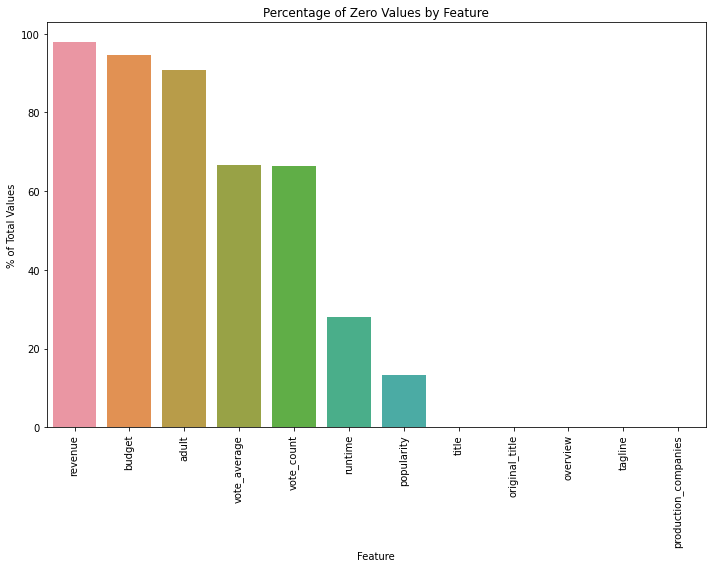

In [0]:
def plot_zero_values(zero_table, title):
    """
    Plots the percentage of zero values per feature, using the 'Column' column
    for the x-axis labels.
    """
    plt.figure(figsize=(10, 8))

    sns.barplot(
        data=zero_table,
        x='Column',
        y='% of Total Values'
    )

    # Rotate x-labels for readability
    plt.xticks(rotation=90)

    # Set labels and title
    plt.title(title)
    plt.xlabel('Feature')
    plt.ylabel('% of Total Values')

    plt.tight_layout()
    plt.show()

# print
plot_zero_values(zero_values, title='Percentage of Zero Values by Feature')

## Missing or Zero Values Summary

### Missing Values
These columns have significant number of null entries:
- **tagline** (85.4% missing)  
- **keywords** (72.1% missing)  
- **production_companies** (54.2% missing)
- **imdb_id** (46.5% missing)  
- **production_countries** (44.2% missing)  
- **spoken_languages** (~42% missing)  
- **genres** (39.6% missing)  
- **overview** (20.6% missing)  
- **release_date** (17.3% missing)

### Zero Values
The following columns contain a substantial fraction of zeros:
- **revenue** (98% zeros)  
- **budget** (94.6% zeros)  
- **adult** (90.7% zeros)
- **vote average** (66.6% zeros)
- **vote_count** (66.5%)   
- **runtime** (28% zeros) 
- **popularity** (13.2% zeros)   


##ID and IMDB_ID 

First, we will check for duplicates by **id** and **imdb_id**

In [0]:
# Calculate total and distinct counts
total_rows = df.count()
unique_id = df.select(countDistinct("id")).collect()[0][0]
unique_imdb_id = df.select(countDistinct("imdb_id")).collect()[0][0]

# Calculate duplicated counts
duplicated_id = total_rows - unique_id
duplicated_imdb_id = total_rows - unique_imdb_id

# Print results
print(f"Total duplicated IDs: {duplicated_id}")
print(f"Total duplicated IMDB IDs: {duplicated_imdb_id}")

# Display examples of duplicated 'id' rows
dup_id_vals = (
    df
    .groupBy("id")
    .count()
    .filter(col("count") > 1)
    .select("id")
)
dup_id_rows = (
    df
    .join(dup_id_vals, on="id", how="inner")
    .orderBy("id")
)
print("Examples of duplicated 'id' rows:")
display(dup_id_rows.limit(10))

# Display examples of duplicated 'imdb_id' rows 
dup_imdb_vals = (
    df
    .groupBy("imdb_id")
    .count()
    .filter(col("count") > 1)
    .select("imdb_id")
)
dup_imdb_rows = (
    df
    .join(dup_imdb_vals, on="imdb_id", how="inner")
    .orderBy("imdb_id")
)
print("Examples of duplicated 'imdb_id' rows:")
display(dup_imdb_rows.limit(10))

Total duplicated IDs: 794
Total duplicated IMDB IDs: 489255
Examples of duplicated 'id' rows:


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
1192939,Soldiers from Eastern Europe 6,0.0,0,Released,null,0,0,true,0,null,en,Soldiers from Eastern Europe 6,null,0.0,null,null,null,null,null,null
1192939,Soldiers from Eastern Europe 6,0.0,0,Released,null,0,0,true,0,null,en,Soldiers from Eastern Europe 6,null,0.0,null,null,null,null,null,null
1192939,Soldiers from Eastern Europe 6,0.0,0,Released,4/4/2004,0,90,true,0,null,en,Soldiers from Eastern Europe 6,11 horny & hung soldiers in 5 hot scenes! You gotta love a man in uniform!,0.0,null,null,Eagle Video,Czech Republic,null,null
1192939,Soldiers from Eastern Europe 6,0.0,0,Released,4/4/2004,0,90,true,0,null,en,Soldiers from Eastern Europe 6,11 horny & hung soldiers in 5 hot scenes! You gotta love a man in uniform!,0.0,null,null,Eagle Video,Czech Republic,null,null
1192940,杀夫,0.0,0,Released,null,0,0,false,0,null,zh,杀夫,null,0.0,null,null,null,null,null,null
1192940,杀夫,0.0,0,Released,null,0,0,false,0,null,zh,杀夫,null,0.6,null,null,null,null,null,null
1192941,Ekda Yeun Tar Bagha,0.0,0,Post Production,11/24/2023,0,0,false,0,null,mr,एकदा येऊन तर बघा,upcoming marathi film,1.072,YOU WOULDN'T GO BACK,Comedy,"Ideas The Entertainment Company, SR Enterprises, Gold Mountain, Swarna Pat Katha, Group M Motion Entertainment, Kaleidoscope Cinema And Picture",India,Marathi,null
1192941,एकदा येऊन तर बघा,0.0,0,Released,null,0,0,false,0,null,en,एकदा येऊन तर बघा,upcoming marathi film,0.0,null,null,null,null,null,null
1192941,एकदा येऊन तर बघा,0.0,0,Released,null,0,0,false,0,null,en,एकदा येऊन तर बघा,upcoming marathi film,0.0,null,null,null,null,null,null
1192941,Ekda Yeun Tar Bagha,0.0,0,Post Production,11/24/2023,0,0,false,0,null,mr,एकदा येऊन तर बघा,upcoming marathi film,1.072,YOU WOULDN'T GO BACK,Comedy,"Ideas The Entertainment Company, SR Enterprises, Gold Mountain, Swarna Pat Katha, Group M Motion Entertainment, Kaleidoscope Cinema And Picture",India,Marathi,null


Examples of duplicated 'imdb_id' rows:


imdb_id,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
None,1410815,First Draft,8.0,1,Released,1/1/2025,0,4,false,0,en,First Draft,"Kalpana, an unfinished character, steps into reality, reflecting her creator's struggles and inspiring him to complete his story.",1.4,more than just ink on paper,Drama,null,null,English,"writer's block, fictional character comes to life"
None,1410736,Kim: Masum?,10.0,2,Released,null,1,0,false,1,tr,Kim: Masum?,null,1.4,null,null,Anka Medya,null,Turkish,null
None,1410896,New Year's Fuck,0.0,0,Released,1/16/2024,0,139,true,0,en,New Year's Fuck,"Carter Woods is back, baby. Back from a long trip, that is. And Brandon Anderson is happy to welcome him back, but when Carter discovers Brandon has feelings for him, it puts everything into a new perspective. So what's gonna happen next in New Year's Fuck? Shane Cook has a problem: he hasn't been able to get laid because his dick is just too big. So when Luke Truong offers to help Shane with his problem, things take a wild turn. It's New Years Eve and bros Roman Todd and Andrew Miller are celebrating together. But when Andrew admits that he's never had a New Year's kiss, Roman takes it upon himself to figure out a way to change that; and maybe do much more. Scott Finn just had something extremely embarrassing happen: he had a wet dream about his roommate, Diego Daniels. However, when Diego finds out, things take an unexpected twist that'll only make Scott and Diego bond even more.",0.0,null,null,Next Door Studios,United States of America,null,"tattoo, holiday, anal sex, locker room, rimming, oral sex, big dick, gay pornography, muscled men"
None,1410614,Shantanu Holmes,8.7,3,Released,1/1/2025,0,22,false,46,hi,Shantanu Holmes,Have a look in a chaotic 24-hour adventure in the life of a private investigator Shantanu Kumar••,1.4,null,Mystery,null,India,"English, Hindi",null
None,1410977,"Non piscio, sborro!",7.0,1,Released,1/1/2011,0,0,true,0,it,"Non piscio, sborro!",null,0.0,null,null,Cento X Cento,null,null,null
None,1410811,Io porca e io troia,7.0,2,Released,1/1/2011,0,0,true,0,it,Io porca e io troia,null,0.0,null,null,Cento X Cento,Italy,null,null
None,1410679,Franky,9.0,1,Released,7/5/2024,0,25,true,0,en,Franky,"In purgatory, Franky recounts his relentless, action-packed quest to avenge his girlfriend's murder, leading to a shocking confrontation.",0.0,Franky,"Action, Adventure, Thriller, Drama","Pax Films, Fictional Mannequins",null,Malayalam,"aggressive, absurd, amused"
None,1410973,Backstage,6.0,1,Released,1/1/2011,0,0,true,0,it,Backstage,null,0.0,null,null,Moonlight Video,null,null,null
None,1410970,Attenti a quelle due 2,6.0,1,Released,1/1/2011,0,0,true,0,it,Attenti a quelle due 2,null,0.0,null,null,Cento X Cento,null,null,null
None,1410583,O Diamante,10.0,1,Released,10/11/2024,0,0,false,0,pt,O Diamante,null,0.92,null,"Comedy, Animation, Drama","Velvet Produção, Grizzly Filmes",Brazil,null,null


In [0]:
# Count how many "None" strings are in imdb_id
none_count = df.filter(col("imdb_id") == "None").count()

# Replace "None" strings with actual nulls
df = df.withColumn(
    "imdb_id",
    when(col("imdb_id") == "None", None)
      .otherwise(col("imdb_id"))
)

# Print how many values were set to null
print(f"Number of 'None' values replaced with null in 'imdb_id': {none_count}")


Number of 'None' values replaced with null in 'imdb_id': 408


In [0]:
# Calculate counts for non-null imdb_id values
non_null_rows = df.filter(col("imdb_id").isNotNull()).count()
unique_non_null = (
    df
    .filter(col("imdb_id").isNotNull())
    .select(countDistinct("imdb_id"))
    .collect()[0][0]
)
duplicated_imdb_id = non_null_rows - unique_non_null

# Print the results
print(f"Total non-null imdb_id rows: {non_null_rows}")
print(f"Total duplicated IMDB IDs (excluding nulls): {duplicated_imdb_id}")

# Display examples of duplicated 'imdb_id' rows
dup_imdb_vals = (
    df
    .filter(col("imdb_id").isNotNull())
    .groupBy("imdb_id")
    .count()
    .filter(col("count") > 1)
    .select("imdb_id")
)

dup_imdb_rows = (
    df
    .join(dup_imdb_vals, on="imdb_id", how="inner")
    .orderBy("imdb_id")
)

print("Examples of duplicated 'imdb_id' rows:")
display(dup_imdb_rows.limit(10))


Total non-null imdb_id rows: 560572
Total duplicated IMDB IDs (excluding nulls): 1253
Examples of duplicated 'imdb_id' rows:


imdb_id,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
tt0003037,1317649,Juve contre Fantômas,0.0,0,Released,null,0,0,false,0,fr,Juve contre Fantômas,null,0.65,null,"Crime, Drama",Gaumont,null,null,null
tt0003037,1185482,Fantômas: The Man in Black,0.0,0,Released,9/12/1914,0,61,false,0,fr,Fantômas: Juve contre Fantômas,"In Part Two of Louis Feuillade's 5 1/2-hour epic follows Fantômas, the criminal lord of Paris, master of disguise, the creeping assassin in black, as he is pursued by the equally resourceful Inspector Juve.",0.6,null,Thriller,null,France,null,null
tt0003165,1317653,Fantômas - Le Mort qui tue,0.0,0,Released,null,0,0,false,0,fr,Fantômas - Le Mort qui tue,null,0.6,null,"Crime, Drama",Gaumont,France,No Language,null
tt0003165,1185457,Fantômas: The Dead Man Who Killed,0.0,0,Released,11/28/1913,0,90,false,0,fr,Fantômas: Le mort qui tue,"After a body disappears from inside the prison, a series of crimes take place, all seemingly by the dead man. With Juve presumed dead, Fandor must investigate alone. Will Fantomas finally be brought to justice?",1.377,null,Thriller,null,null,null,null
tt0003930,1185487,Fantômas: Fantômas versus Fantômas,0.0,0,Released,3/13/1914,0,59,false,0,fr,Fantômas: Fantômas contre Fantômas,"The press and the public opinion suggest that Inspector Juve may in fact be Fantômas. As Juve is jailed, the actual Fantômas schemes to keep him behind bars forever.",0.6,null,Thriller,null,France,null,null
tt0003930,1217400,Fantômas contre Fantômas,0.0,0,Released,1/5/1914,0,0,false,0,es,Fantômas contre Fantômas,null,0.0,null,null,null,null,null,null
tt0003952,1317657,Fantômas - Le Faux magistrat,0.0,0,Released,null,0,0,false,0,fr,Fantômas - Le Faux magistrat,null,0.65,null,"Crime, Drama",Gaumont,France,No Language,null
tt0003952,1185477,Fantômas: The False Magistrate,0.0,0,Released,5/8/1914,0,70,false,0,fr,Fantômas: Le faux magistrat,"Fantômas has been arrested and is jailed in Brussels, but inspector Juve wants him arrested and sentenced for all his crimes in France. Thus Juve settles Fantômas' escape so he can be traced to his gang's, in Saint-Calais - France, where apaches Paulet and Ribonard have just robbed the diamonds of the broke Marquis de Tergall. On his way Fantômas kills justice Pradier and decides to go under this disguise when he finds that Pradier had just been appointed to Saint-Calais' court.",0.6,null,Thriller,null,France,null,null
tt0007452,1224040,The Thousand-Dollar Husband,0.0,0,Released,null,0,0,false,0,en,The Thousand-Dollar Husband,null,0.0,null,null,null,null,null,null
tt0007452,1224040,The Thousand-Dollar Husband,0.0,0,Released,5/29/1916,0,50,false,0,en,The Thousand-Dollar Husband,A now lost film directed by James Young and starring Blanche Sweet,1.001,null,"Comedy, Drama",Jesse L. Lasky Feature Play Company,United States of America,null,null


Turns out that the duplicated rows by **id** column are in fact duplicates. 
- We will deduplicate and leave only the row with the lest number of null values.

When it comes to **imdb_id**, those also concern the same movies but with original and translated titles. 
- We will deduplicate using the same logic as we used with **id**


In [0]:
def drop_duplicates_keep_least_null(df, id_col="id"):
    """
    Remove duplicate rows among those with non-null `id_col`, keeping the row with the fewest null values.
    Rows where `id_col` is null are left untouched.
    Prints how many rows were dropped among non-null IDs.
    """
    # Split into rows with and without an ID
    non_null_df = df.filter(col(id_col).isNotNull())
    null_df     = df.filter(col(id_col).isNull())
    
    # Count non-null rows before deduplication
    orig_count = non_null_df.count()
    
    # For each row, count how many columns are null
    null_count_expr = sum(
        when(col(c).isNull(), 1).otherwise(0) for c in non_null_df.columns
    ).alias("_null_count")
    nn_with_nulls = non_null_df.withColumn("_null_count", null_count_expr)
    
    # Within each id group, rank rows by null_count ascending
    window = Window.partitionBy(id_col).orderBy(col("_null_count").asc())
    ranked = nn_with_nulls.withColumn("_rn", row_number().over(window))
    
    # Keep only the first row for each id (fewest nulls), drop helper cols
    deduped_non_null = (
        ranked
        .filter(col("_rn") == 1)
        .drop("_null_count", "_rn")
    )
    
    # Count how many non-null rows were dropped
    new_count = deduped_non_null.count()
    dropped = orig_count - new_count
    print(f"Dropped {dropped} duplicate rows among non-null '{id_col}'.")
    
    # Combine back with the untouched null-ID rows
    result_df = deduped_non_null.unionByName(null_df)
    return result_df

# Use the function to deduplicate by "id", preserving rows with null id
df = drop_duplicates_keep_least_null(df, id_col="id")

display(df.limit(10))

Dropped 794 duplicate rows among non-null 'id'.


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
26,Walk on Water,6.9,80,Released,2/5/2004,444,103,false,1400000,tt0352994,he,LaLehet Al HaMayim,"Eyal, an Israeli Mossad agent, is given the mission to track down and kill the very old Alfred Himmelman, an ex-Nazi officer, who might still be alive. Pretending to be a tourist guide, he befriends his grandson Axel, in Israel to visit his sister Pia. The two men set out on a tour of the country, during which Axel challenges Eyal's values.",5.316,He was trained to hate until he met the enemy.,Drama,"Lama Films, United King Films","Israel, Sweden","English, Arabic, Hebrew, German, Turkish, Italian","israel, palestinian-israeli conflict, berlin, germany, neo-nazism, chauffeur, dead sea, mossad, nazi, homophobia, jerusalem, israel, gay club, anti-semitism, kibbutz, suicide mission, lgbt, gay theme"
27,9 Songs,5.653,462,Released,7/16/2004,1574623,69,false,1000000,tt0411705,en,9 Songs,"Matt, a young glaciologist, soars across the vast, silent, icebound immensities of the South Pole as he recalls his love affair with Lisa. They meet at a mobbed rock concert in a vast music hall - London's Brixton Academy. They are in bed at night's end. Together, over a period of several months, they pursue a mutual sexual passion whose inevitable stages unfold in counterpoint to nine live-concert songs.",30.475,"2 lovers, one summer, and the 9 songs that defined them.","Drama, Music, Romance",Revolution Films,United Kingdom,English,"london, england, concert, rock 'n' roll, sexuality, orgasm, cocaine, man woman relationship, condom, love, sexual fantasy, pubic hair, breast, ejaculation, american, couple, desire, sexual desire, cunnilingus, naked, exchange student, rock concert, british man, nude, drug, small tits, woman tied to a bed, sex, sexual, vulva, rock, unsimulated sex, intense, fellatio, tied to a bed, erect penis, small breasts, blowjob"
28,Apocalypse Now,8.282,7485,Released,8/15/1979,150000000,147,false,31500000,tt0078788,en,Apocalypse Now,"At the height of the Vietnam war, Captain Benjamin Willard is sent on a dangerous mission that, officially, ""does not exist, nor will it ever exist."" His goal is to locate - and eliminate - a mysterious Green Beret Colonel named Walter Kurtz, who has been leading his personal army on illegal guerrilla missions into enemy territory.",37.715,This is the end...,"Drama, War","United Artists, American Zoetrope",United States of America,"Khmer, English, French, Vietnamese","guerrilla warfare, epic, vietnam war, journalist, mission, vietnam, vietcong, cia, cambodia, army, drug abuse, based on novel or book, secret mission, insanity, surrealism, tribe, green beret, jungle, descent into madness, brutality, riverboat, military, anti war"
65,8 Mile,7.124,6692,Released,11/8/2002,242875078,111,false,41000000,tt0298203,en,8 Mile,"For Jimmy Smith, Jr., life is a daily fight just to keep hope alive. Feeding his dreams in Detroit's vibrant music scene, Jimmy wages an extraordinary personal struggle to find his own voice - and earn a place in a world where rhymes rule, legends are born and every moment… is another chance.",36.179,Every Moment Is Another Chance,"Drama, Music","Mikona Productions, Imagine Entertainment","Germany, United States of America",English,"individual, adolescence, rap music, hip-hop, rhyme battle, trailer park, street gang, ethnic stereotype, rapper, ghetto, single, detroit, michigan, 1990s, battle rap"
76,Before Sunrise,7.973,3722,Released,1/27/1995,5987386,101,false,2500000,tt0112471,en,Before Sunrise,"A young man and woman meet on a train in Europe, and wind up spending one evening together in Vienna. Unfortunately, both know that this will probably be their only night together.",22.285,Can the greatest romance of your life last only one night?,"Drama, Romance","Castle Rock E

In [0]:
# Now drop duplicates by imdb_id
df = drop_duplicates_keep_least_null(df, id_col="imdb_id")

# Inspect a few rows to confirm
display(df.limit(10))

Dropped 1002 duplicate rows among non-null 'imdb_id'.


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
16613,Clown and His Dogs,4.7,10,Released,1892-10-28,0,10,false,0,tt0000002,fr,Clown et ses chiens,Short film of 300 individually painted images.,2.072,null,Animation,null,France,No Language,"clown, dog, silent film, 19th century, circus act, short film, théâtre optique, les pantomimes lumineuses"
16622,A Good Beer,4.0,8,Released,1892-10-28,0,15,false,0,tt0000004,fr,Un bon bock,null,1.168,null,Animation,null,France,No Language,"19th century, short film, théâtre optique, les pantomimes lumineuses"
105158,Edison Kinetoscopic Record of a Sneeze,4.859,78,Released,1894-01-09,0,1,false,0,tt0000008,xx,Edison Kinetoscopic Record of a Sneeze,A man (Thomas Edison's assistant) takes a pinch of snuff and sneezes. This is one of the earliest Thomas Edison films and was the first motion picture to be copyrighted in the United States.,3.077,null,Documentary,Edison Studios,United States of America,No Language,null
774,Workers Leaving the Lumière Factory,6.685,297,Released,1895-03-22,0,1,false,0,tt0000010,fr,La Sortie de l'Usine Lumière à Lyon,"Working men and women leave through the main gate of the Lumière factory in Lyon, France. Filmed on 22 March 1895, it is often referred to as the first real motion picture ever made, although Louis Le Prince's 1888 Roundhay Garden Scene pre-dated it by seven years. Three separate versions of this film exist, which differ from one another in numerous ways. The first version features a carriage drawn by one horse, while in the second version the carriage is drawn by two horses, and there is no carriage at all in the third version. The clothing style is also different between the three versions, demonstrating the different seasons in which each was filmed. This film was made in the 35 mm format with an aspect ratio of 1.33:1, and at a speed of 16 frames per second. At that rate, the 17 meters of film length provided a duration of 46 seconds, holding a total of 800 frames.",9.641,null,Documentary,Lumière,France,No Language,"factory worker, factory, lyon, closing time, historical, early cinema, short film"
208234,The Photographical Congress Arrives in Lyon,5.366,82,Released,1895-06-12,0,1,false,0,tt0000013,fr,Le débarquement du congrès de photographie à Lyon,"Down the gangway, photographers leave the deck of a riverboat in large numbers.",3.358,null,Documentary,Lumière,France,No Language,null
159896,Autour d’une cabine,5.833,48,Released,1894-12-15,0,2,false,0,tt0000015,dz,Autour d’une cabine,The film consists of a series of animations on a beach containing two beach huts and a diving board. Two characters play at diving into the water from the diving board and then appear on the beach. The woman begins to play with a small dog and is then joined by a gentleman. The two play around on the beach before getting changed into bathing costumes and going into the water. They bob up and down in the water before swimming out of the scene. Once the couple have gone a man sails out in a boat.,2.466,null,Animation,null,France,No Language,"19th century, short film, théâtre optique, les pantomimes lumineuses"
194081,Italienischer Bauerntanz,4.056,18,Released,1895-11-01,0,1,false,0,tt0000017,de,Italienischer Bauerntanz,"Two children, Ploetz and Larella, perform an Italian peasant dance.",1.001,null,Documentary,null,Germany,"German, No Language","dance, silent film"
415406,The Clown Barber,1.0,1,Released,1898-08-01,0,1,false,0,tt0000019,en,The Clown Barber,A clown cuts off a customer's head and replaces it.,0.6,null,Comedy,Williamson Kinematograph Company,United Kingdom,null,silent film
127777,The Blacksmiths,5.052,67,Released,1895-12-28,0,1,false,0,tt0000022,fr,Les forgerons,"While his aide continuously turns the handle of the bellows, keeping hot a small furnace in front of him, a blacksmith is poundi

In [0]:
# Sanity check - recalculate duplicates
# Total rows
total_rows = df.count()

# id duplicates (id never null)
unique_id = df.select(countDistinct("id")).collect()[0][0]
duplicated_id = total_rows - unique_id

# imdb_id duplicates (exclude null/"None")
valid_imdb = df.filter(col("imdb_id").isNotNull() & (col("imdb_id") != "None"))
total_valid = valid_imdb.count()
unique_imdb = valid_imdb.select(countDistinct("imdb_id")).collect()[0][0]
duplicated_imdb_id = total_valid - unique_imdb

print(f"Total duplicated IDs: {duplicated_id}")
print(f"Total duplicated IMDB IDs (excluding nulls): {duplicated_imdb_id}")


Total duplicated IDs: 0
Total duplicated IMDB IDs (excluding nulls): 0


Now, **id** and **imdb_id** columns are deduplicated. Their datatype is correct, so no need for further changes.

## TITLE

In [0]:
# Count null, empty, and "None"/"none" titles
null_count = df.filter(col("title").isNull()).count()
empty_count = df.filter((col("title") == "") | (col("title") == " ")).count()
none_count = df.filter((col("title") == "None") | (col("title") == "none")).count()

print(f"Null titles: {null_count}")
print(f"Empty titles: {empty_count}")
print(f"None titles: {none_count}")

Null titles: 13
Empty titles: 3
None titles: 0


In [0]:
# Title length distribution
title_len_df = df.withColumn("title_length", length(col("title")))
min_len = title_len_df.agg({"title_length": "min"}).collect()[0][0]
max_len = title_len_df.agg({"title_length": "max"}).collect()[0][0]
median_len = title_len_df.approxQuantile("title_length", [0.5], 0.01)[0]
print(f"Title length — min: {min_len}, median: {median_len:.0f}, max: {max_len}")

# Show extremes
print("Longest titles:")
display(
    title_len_df
    .orderBy(col("title_length").desc())
    .select("id", "title", "title_length")
    .limit(5)
)
print("Shortest non-empty titles:")
display(
    title_len_df
    .filter(col("title").isNotNull() & (col("title") != ""))
    .orderBy(col("title_length").asc())
    .select("id", "title", "title_length")
    .limit(5)
)


Title length — min: 1, median: 17, max: 324
Longest titles:


id,title,title_length
622274,"NHDTA-775 Climaxing Over and Over! Repeated Family Creampies! - My Big Sister Was A Cold Bitch When I Fucked Her With A Condom On, But When I Secretly Fucked Her Raw She Suddenly Turned Into A Screaming Banshee! She Started Cumming Over And Over Again! We Did So Many Family Creampies Together! The Big Sister Gal Edition 01",324
862328,A Video Record of Secretly Filmed Footage by the Manager of an Office Lady Dormitory I Was Staring at This Voluptuous Female Employee with Light Skin and Her Big Erotic Ass When She Invited Me to Her Room One Afternoon and We Fucked Like Crazy Aya Miyazaki,256
1047540,"Obedient Married Woman With A Shaved Pussy - 37-Year-Old Yuri Momose's Adult Video Debut - She's A Hottie Who Used To Be A Nude Model And Misses The Thrill Of Being Watched. This Nympho Wife Is So Horny She's Raring To Fuck Any Time, Any Place! Yuri Momose",256
838829,"Ravished! The Chains Of Betrayal! Private Girls' School Student! If You Don't Want My Creampie, Call Your Friends! She Calls Her Own Mother, Who In Turn Calls A Friend To Take Her Place! Made To Cum With Endless Pounding And Creampie Sex - 10 Loads In All!",256
999778,"An Amateur Couple Focus Group Investigation We Went On A Search For A Lovey Dovey Couple Anywhere On The Street And Asked Them To Take On An Extreme Mission! If This Couple Can Engage In Partner Swapping In Front Of Our Cameras, They'll Win 1 Million Yen!!",256


Shortest non-empty titles:


id,title,title_length
438720,X,1
333125,W,1
24791,A,1
277218,A,1
31644,$,1


**title** column does not have any missing values and has the right data type.

##VOTE_AVERAGE and VOTE_COUNT

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for vote_average and vote_count
total = df.count()

for cname in ["vote_average", "vote_count"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") | (col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    
    print(
        f"{cname}: total={total}, "
        f"nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}"
    )

vote_average: total=1046779, nulls=0, empty strings=0, 'None'/'none' strings=0
vote_count: total=1046779, nulls=0, empty strings=0, 'None'/'none' strings=0


First, we need to cast **vote_average** and **vote_count** into correct data types:

In [0]:
# Cast vote_average to double and vote_count to integer
df = (
    df
    .withColumn("vote_average", col("vote_average").cast("double"))
    .withColumn("vote_count",    col("vote_count").cast("integer"))
)

# Verify schema
df.select("vote_average", "vote_count").printSchema()

root
 |-- vote_average: double (nullable = true)
 |-- vote_count: integer (nullable = true)



In [0]:
# Count instances where vote_average == 0
count_avg_zero = df.filter(col("vote_average") == 0).count()
print(f"Number of rows with vote_average == 0: {count_avg_zero}")

# Count instances where vote_count == 0
count_count_zero = df.filter(col("vote_count") == 0).count()
print(f"Number of rows with vote_count == 0: {count_count_zero}")

Number of rows with vote_average == 0: 696259
Number of rows with vote_count == 0: 695923


IMDb’s user rating system allows you to assign any whole-number score from 1 (the lowest) up to 10 (the highest) for any movie.

In [0]:
# Movies with vote_average below the allowed minimum (1)
below_allowed = df.filter(col("vote_average") < 1)
count_below = below_allowed.count()
print(f"Number of movies with vote_average below 1: {count_below}")

# Movies with vote_average above the allowed maximum (10)
above_allowed = df.filter(col("vote_average") > 10)
count_above = above_allowed.count()
print(f"Number of movies with vote_average above 10: {count_above}")

Number of movies with vote_average below 1: 696747
Number of movies with vote_average above 10: 0


In [0]:
# Replace those invalid vote_average values with null
df = df.withColumn(
    "vote_average",
    when(col("vote_average") < 1, None)
     .otherwise(col("vote_average"))
)

# Verify none remain
remaining_invalid = df.filter(col("vote_average") < 1).count()
print(f"Remaining vote_average < 1 after cleanup: {remaining_invalid}")

Remaining vote_average < 1 after cleanup: 0


In [0]:
# Movies where vote_count == 0 but vote_average != 0
cond = df.filter((col("vote_count") == 0) & (col("vote_average") != 0))
count = cond.count()
print(f"Number of movies with vote_count == 0 and vote_average != 0: {count}")
# Display all columns for a few examples
display(cond.limit(5))

Number of movies with vote_count == 0 and vote_average != 0: 441


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
314921,Old Heidelberg,4.0,0,Released,11/14/1915,0,50,false,0,tt0005823,en,Old Heidelberg,"Karl Heinrich is the heir to the throne of the small European principality of Rutania, but he's a lonely child, not allowed to play with other children and knowing little about life outside the castle. When he reaches maturity, he is sent to attend the University of Heidelberg, and finds fellowshi with classmates and a blossoming love with Katie Ruder, his only friend during childhood and the niece of an innkeeper. However, political turmoil in Rutania forces him to return. War is declared. Heinrich returns to Heidelberg one last time to bid a somber farewell to his beloved Katie.",0.868,null,"Romance, Drama, War","Fine Arts Film Company, Triangle Film Corporation",United States of America,No Language,"castle, royalty"
501175,Burglar by Proxy,5.0,0,Released,8/23/1919,0,58,false,0,tt0009975,en,Burglar by Proxy,"A terrible toothache causes Jack Robin to stop his automobile in front of the home of Dorothy Mason. Noticing a flat tire, Jack attaches his automatic pump and forgets about it as he listens enthralled to Dorothy's singing. When the sound of the burst tire brings Dorothy running out, Jack feigns injury so he can be nursed by her. After he leaves the house, and Dorothy's father discovers some important invention plans missing, Harlan Graves, Dorothy's suitor, suggests that Jack stole them. Jack, suspecting Graves, breaks into Graves' home to clear himself and meets a real burglar, ""Spider"" Kelly, who adopts Jack as his guide. They blow up a safe at a house party where Jack suspects the plans to be hidden. The papers are found, Graves is arrested and Spider, disappointed that Jack made such a mess in blowing the safe, goes off, leaving Dorothy and Jack happily alone.",0.846,null,Comedy,Jack Pickford Productions,United States of America,null,null
186433,Mountain of Destiny,5.0,0,Released,5/10/1924,0,92,false,0,tt0014713,de,Der Berg des Schicksals,"After a mountaineer is killed attempting to climb a difficult mountain, his son dreams of conquering the peak that has defeated his father. But his mother makes him promise never to attempt it. Events eventually force her to release him from the promise, and he ascends the mountain successfully.",0.6,null,Drama,Berg- und Sportfilm,Germany,No Language,null
284241,Hearts in Dixie,3.0,0,Released,1/2/1929,0,71,false,0,tt0019971,en,Hearts in Dixie,Nappus sends his grandson north for schooling to shelter him from their community.,0.732,The Soul of Dixieland Talking and Singing from the Motion Picture Screen!,"Music, Drama",Fox Film Corporation,United States of America,English,"gambling, musical, drinking, racial stereotype, cotton picker, dixieland"
314247,Der arme Millionär,5.0,0,Released,7/11/1939,0,0,false,0,tt0031053,de,Der arme Millionär,null,0.84,null,Comedy,null,Germany,null,null


In [0]:
# Count how many rows have vote_count == 0
zero_count = df.filter(col("vote_count") == 0).count()
print(f"Found {zero_count} rows with vote_count == 0; setting vote_average to null for these.")

# Replace vote_average with null where vote_count is zero
df = df.withColumn(
    "vote_average",
    when(col("vote_count") == 0, None)
     .otherwise(col("vote_average"))
)

# Verify that no row with vote_count == 0 still has a non-null vote_average
remaining = df.filter((col("vote_count") == 0) & col("vote_average").isNotNull()).count()
print(f"Remaining rows with vote_count == 0 and non-null vote_average: {remaining}")

Found 695923 rows with vote_count == 0; setting vote_average to null for these.
Remaining rows with vote_count == 0 and non-null vote_average: 0


In [0]:

# Examples where vote_average == 0
count_avg_zero = df.filter(col("vote_average") == 0).count()
print(f"Number of rows with vote_average == 0: {count_avg_zero}")

# Examples where vote_count == 0
count_count_zero = df.filter(col("vote_count") == 0).count()
print(f"Number of rows with vote_count == 0: {count_count_zero}")

Number of rows with vote_average == 0: 0
Number of rows with vote_count == 0: 695923


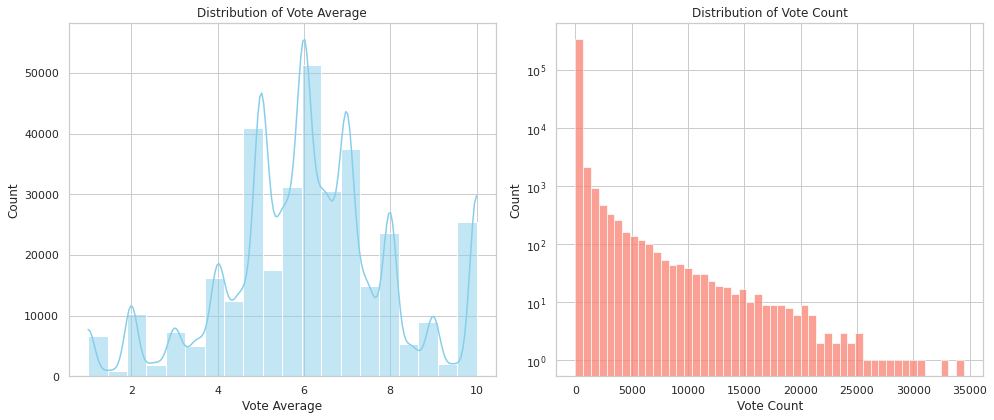

In [0]:
# Convert only the needed columns to Pandas to avoid memory issues
df_plot = df.select("vote_average", "vote_count").dropna().toPandas()

# Set seaborn style
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot vote_average histogram
sns.histplot(df_plot['vote_average'], bins=20, kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of Vote Average')
axes[0].set_xlabel('Vote Average')
axes[0].set_ylabel('Count')

# Plot vote_count histogram (log scale)
sns.histplot(df_plot['vote_count'], bins=50, kde=False, ax=axes[1], color='salmon')
axes[1].set_title('Distribution of Vote Count')
axes[1].set_xlabel('Vote Count')
axes[1].set_ylabel('Count')
axes[1].set_yscale('log')  # log scale for better readability of skewed data

plt.tight_layout()
plt.show()

The distribution for **vote_average** looks almost normal, with a bump around 5 and 6–7, which aligns with typical average ratings on platforms like IMDb or TMDB.

When it comes to **vote_count**, there's a long tail of movies with thousands of votes, likely the popular ones. However, a big portion of movies did not receive any votes.

## STATUS

**status** is in correct data type. First, let's check for distinct values 

In [0]:
# Count distinct non-null statuses
distinct_status_count = df.filter(col("status").isNotNull()).select("status").distinct().count()
print(f"Number of distinct 'status' values (excluding nulls): {distinct_status_count}")

# Show frequency of each status
status_counts = df.groupBy("status").count().orderBy(col("count").desc())
print("Counts per status:")
display(status_counts)


Number of distinct 'status' values (excluding nulls): 6
Counts per status:


status,count
Released,1021050
In Production,10593
Post Production,8224
Planned,6307
Rumored,344
Canceled,261


In [0]:
# Calculate average and median revenue by status
status_revenue_stats = (
    df
    .groupBy("status")
    .agg(
        F.avg("revenue").alias("average_revenue"),
        F.expr("percentile_approx(revenue, 0.5)").alias("median_revenue")
    )
    .orderBy("status")
)

# Display the results
display(status_revenue_stats)


status,average_revenue,median_revenue
Canceled,0.7662835249042146,0
In Production,302234.2407250071,0
Planned,11.698588869510068,0
Post Production,372690.02006322955,0
Released,774770.3214083541,0
Rumored,471.76162790697674,0


**We need to decide whether to predict the revenue of movies with all statuses or just the ones released**

## RELEASE DATE

First, we need to handle the data type of **release_date**. Upon initial feature investigation, we realized that some dates might be in US formats and some in EU. We will need to hadle it appropriately.

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for release_date
total_rows    = df.count()
null_count    = df.filter(col("release_date").isNull()).count()
empty_count   = df.filter((col("release_date") == "") | (col("release_date") == " ")).count()
none_count    = df.filter(col("release_date").isin("None", "none")).count()

print(f"Total rows: {total_rows}")
print(f"Null release_date values          : {null_count}")
print(f"Empty-string release_date values  : {empty_count}")
print(f"'None'/'none' release_date values : {none_count}")

Total rows: 1046779
Null release_date values          : 180567
Empty-string release_date values  : 0
'None'/'none' release_date values : 0


In [0]:
# Switch back to the old, pre–Spark-3.0 date parser behavior
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

# Trim whitespace and normalize separators (remove spaces around -, /, .)
df = df.withColumn(
    "release_date_norm",
    regexp_replace(
        trim(col("release_date")),
        r"\s*([/\-\.])\s*",
        r"$1"
    )
)

# Try parsing with a variety of common date formats
df = df.withColumn(
    "release_date_parsed",
    coalesce(
        to_date(col("release_date_norm"), "yyyy-MM-dd"),
        to_date(col("release_date_norm"), "yyyy/MM/dd"),
        to_date(col("release_date_norm"), "yyyy.MM.dd"),
        to_date(col("release_date_norm"), "MM-dd-yyyy"),
        to_date(col("release_date_norm"), "MM/dd/yyyy"),
        to_date(col("release_date_norm"), "MM.dd.yyyy"),
        to_date(col("release_date_norm"), "dd-MM-yyyy"),
        to_date(col("release_date_norm"), "dd/MM/yyyy"),
        to_date(col("release_date_norm"), "dd.MM.yyyy")
    )
)

# How many rows actually parsed to a non-null date?
total = df.count()
parsed_non_null = df.filter(col("release_date_parsed").isNotNull()).count()
parsed_null     = total - parsed_non_null

print(f"Total rows:                {total}")
print(f"Rows parsed successfully:  {parsed_non_null}")
print(f"Rows that failed to parse: {parsed_null}")


Total rows:                1046779
Rows parsed successfully:  866212
Rows that failed to parse: 180567


In [0]:

# Replace the old column with the parsed one since all the rows accepted the correct type
df = df.drop("release_date").withColumnRenamed("release_date_parsed", "release_date")

# Display the DataFrame with the parsed release_date column
display(df.limit(5))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
16613,Clown and His Dogs,4.7,10,Released,0,10,false,0,tt0000002,fr,Clown et ses chiens,Short film of 300 individually painted images.,2.072,null,Animation,null,France,No Language,"clown, dog, silent film, 19th century, circus act, short film, théâtre optique, les pantomimes lumineuses",1892-10-28,1892-10-28
16622,A Good Beer,4.0,8,Released,0,15,false,0,tt0000004,fr,Un bon bock,null,1.168,null,Animation,null,France,No Language,"19th century, short film, théâtre optique, les pantomimes lumineuses",1892-10-28,1892-10-28
105158,Edison Kinetoscopic Record of a Sneeze,4.859,78,Released,0,1,false,0,tt0000008,xx,Edison Kinetoscopic Record of a Sneeze,A man (Thomas Edison's assistant) takes a pinch of snuff and sneezes. This is one of the earliest Thomas Edison films and was the first motion picture to be copyrighted in the United States.,3.077,null,Documentary,Edison Studios,United States of America,No Language,null,1894-01-09,1894-01-09
774,Workers Leaving the Lumière Factory,6.685,297,Released,0,1,false,0,tt0000010,fr,La Sortie de l'Usine Lumière à Lyon,"Working men and women leave through the main gate of the Lumière factory in Lyon, France. Filmed on 22 March 1895, it is often referred to as the first real motion picture ever made, although Louis Le Prince's 1888 Roundhay Garden Scene pre-dated it by seven years. Three separate versions of this film exist, which differ from one another in numerous ways. The first version features a carriage drawn by one horse, while in the second version the carriage is drawn by two horses, and there is no carriage at all in the third version. The clothing style is also different between the three versions, demonstrating the different seasons in which each was filmed. This film was made in the 35 mm format with an aspect ratio of 1.33:1, and at a speed of 16 frames per second. At that rate, the 17 meters of film length provided a duration of 46 seconds, holding a total of 800 frames.",9.641,null,Documentary,Lumière,France,No Language,"factory worker, factory, lyon, closing time, historical, early cinema, short film",1895-03-22,1895-03-22
208234,The Photographical Congress Arrives in Lyon,5.366,82,Released,0,1,false,0,tt0000013,fr,Le débarquement du congrès de photographie à Lyon,"Down the gangway, photographers leave the deck of a riverboat in large numbers.",3.358,null,Documentary,Lumière,France,No Language,null,1895-06-12,1895-06-12


In [0]:
# print df
display(df.limit(5))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
16613,Clown and His Dogs,4.7,10,Released,0,10,false,0,tt0000002,fr,Clown et ses chiens,Short film of 300 individually painted images.,2.072,null,Animation,null,France,No Language,"clown, dog, silent film, 19th century, circus act, short film, théâtre optique, les pantomimes lumineuses",1892-10-28,1892-10-28
16622,A Good Beer,4.0,8,Released,0,15,false,0,tt0000004,fr,Un bon bock,null,1.168,null,Animation,null,France,No Language,"19th century, short film, théâtre optique, les pantomimes lumineuses",1892-10-28,1892-10-28
105158,Edison Kinetoscopic Record of a Sneeze,4.859,78,Released,0,1,false,0,tt0000008,xx,Edison Kinetoscopic Record of a Sneeze,A man (Thomas Edison's assistant) takes a pinch of snuff and sneezes. This is one of the earliest Thomas Edison films and was the first motion picture to be copyrighted in the United States.,3.077,null,Documentary,Edison Studios,United States of America,No Language,null,1894-01-09,1894-01-09
774,Workers Leaving the Lumière Factory,6.685,297,Released,0,1,false,0,tt0000010,fr,La Sortie de l'Usine Lumière à Lyon,"Working men and women leave through the main gate of the Lumière factory in Lyon, France. Filmed on 22 March 1895, it is often referred to as the first real motion picture ever made, although Louis Le Prince's 1888 Roundhay Garden Scene pre-dated it by seven years. Three separate versions of this film exist, which differ from one another in numerous ways. The first version features a carriage drawn by one horse, while in the second version the carriage is drawn by two horses, and there is no carriage at all in the third version. The clothing style is also different between the three versions, demonstrating the different seasons in which each was filmed. This film was made in the 35 mm format with an aspect ratio of 1.33:1, and at a speed of 16 frames per second. At that rate, the 17 meters of film length provided a duration of 46 seconds, holding a total of 800 frames.",9.641,null,Documentary,Lumière,France,No Language,"factory worker, factory, lyon, closing time, historical, early cinema, short film",1895-03-22,1895-03-22
208234,The Photographical Congress Arrives in Lyon,5.366,82,Released,0,1,false,0,tt0000013,fr,Le débarquement du congrès de photographie à Lyon,"Down the gangway, photographers leave the deck of a riverboat in large numbers.",3.358,null,Documentary,Lumière,France,No Language,null,1895-06-12,1895-06-12


In [0]:
# Print the schema to see the data type
df.select("release_date").printSchema()

root
 |-- release_date: date (nullable = true)



In [0]:
# Check for future release dates (dates beyond today)
future_movies = df.filter(col("release_date") > current_date())

# Filter movies released before 1888-01-01
old_movies = df.filter(col("release_date") < lit("1888-01-01"))

# Count and print the result
count_future = future_movies.count()
print(f"Number of movies released after today: {count_future}")
count_old = old_movies.count()
print(f"Number of movies released before 1888: {count_old}")

Number of movies released after today: 389
Number of movies released before 1888: 47


In [0]:
# Display 30 movies with selected columns
display(
    future_movies
    .select("id", "title", "status", "release_date")
    .limit(30)
)


id,title,status,release_date
1302066,Os Perebas,In Production,2025-11-01
1196264,A Figgly Christmas,In Production,2025-11-20
1315380,The Black Pearl,Planned,2025-11-06
987683,O Dia que Tropecei em Mim e Percebi que era Pó,Planned,2025-11-11
83533,Avatar 3,Post Production,2025-12-17
1337295,Devil's Work,Planned,2025-11-20
967941,Wicked: Part Two,In Production,2025-11-26
1003596,Avengers: The Kang Dynasty,Planned,2026-04-29
1034230,Birdemic 4: Garden of Paradise,Planned,2025-05-16
1297842,GOAT,Planned,2026-02-13


**A little fuck up with casting the type probably. Will revisit later**

In [0]:
# Display a few examples 
display(old_movies.limit(20))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
751212,The Musician Monkey,6.048,21,Released,0,1,false,153,tt12592084,xx,Le Singe Musicien,A pre-cinematograph colour animation of the monkey playing his violin.,1.031,null,Animation,null,France,No Language,short film,1878-05-07,1878-05-07
921940,"Zim, Boum, Boum",4.125,8,Released,0,1,false,0,tt16763774,xx,"Zim, Boum, Boum","Praxinoscope animation of a green-suited boy wearing a drum and cymbal. Series 1, number 10",1.4,null,Animation,null,France,No Language,praxinoscope,1878-05-07,1878-05-07
1323532,Les Deux Espiègles,null,0,Released,0,1,false,0,tt32172972,xx,Les Deux Espiègles,"Praxinoscope animation of two girls tossing a cat in a blanket. Series 3, number 4.",0.901,null,Animation,null,null,No Language,null,1878-05-06,1878-05-06
1227240,Buffalo Running,null,0,Released,0,1,false,0,tt5459794,en,Buffalo Running,Individual photographs of the running of a buffalo shot in rapid succession.,0.0,null,Documentary,null,null,null,null,1883-11-19,1883-11-19
585297,L'Homme Machine,4.696,28,Released,0,1,false,0,tt8588366,xx,L'Homme Machine,Animated stick drawings representing a man walking.,1.284,null,Animation,null,France,No Language,null,1885-01-01,1885-01-01
766094,The Magic Rosette,5.583,17,Released,0,1,false,0,tt14495706,xx,La Rosace Magique,"Praxinoscope strip of a shifting rosette. Series 2, number 5.",1.108,null,Animation,null,France,No Language,praxinoscope,1878-05-07,1878-05-07
921930,Dancing on the Rope,4.2,5,Released,0,1,false,0,tt17524422,en,La Danse sur la Corde,"Early Praxinoscope strip showing a girl dancing on a tightrope. Series 1, Number 7.",0.6,null,Animation,null,France,No Language,praxinoscope,1878-05-07,1878-05-07
1271377,Sallie Gardner at a Gallop,null,0,Released,0,1,false,0,tt2221420,en,Sallie Gardner at a Gallop,"The clip shows a jockey, Gilbert Domm, riding a horse, Sallie Gardner. The clip is not filmed; instead, it consists of 24 individual photographs shot in rapid succession, making a moving picture when using a zoopraxiscope.",0.6,null,Documentary,null,null,null,null,1878-06-19,1878-06-19
922184,Les Chiens Savants,4.5,4,Released,0,1,false,0,tt27119262,xx,Les Chiens Savants,"Praxinoscope animation of a boy holding a hoop for two trained dogs to leap through. Series 1, number 8.",1.4,null,Animation,null,France,No Language,praxinoscope,1878-05-07,1878-05-07
1244969,Felix Nadar Spinning in his Chair,null,0,Released,0,1,false,0,tt31150469,fr,Felix Nadar Spinning in his Chair,Felix Nadar Spinning in his Chair,0.6,null,Documentary,Paris Nadar Studio,null,No Language,null,1865-01-01,1865-01-01


The movies released before 1888 turn out to be time-laps photography or similar techniques to capture movemement. Therefore, we will leave them in our dataset.

# CHECKPOINT

In [0]:
# Cell 1: Export current DataFrame to CSV as a checkpoint
output_path = "/FileStore/tables/df_checkpoint"

# Coalesce to 1 file (optional), write with header
df.coalesce(1) \
  .write \
  .mode("overwrite") \
  .option("header", "true") \
  .csv(output_path)

print(f"Checkpoint written to {output_path}/ (use Data → DBFS to download the CSV part file)")


Checkpoint written to /FileStore/tables/df_checkpoint/ (use Data → DBFS to download the CSV part file)


In [0]:
# List the files in your checkpoint folder
files = dbutils.fs.ls("dbfs:/FileStore/tables/df_checkpoint/")
display(files)

path,name,size,modificationTime
dbfs:/FileStore/tables/df_checkpoint/_SUCCESS,_SUCCESS,0,1747316484000
dbfs:/FileStore/tables/df_checkpoint/_committed_7602837222808089198,_committed_7602837222808089198,114,1747311095000
dbfs:/FileStore/tables/df_checkpoint/_committed_9170794194172993147,_committed_9170794194172993147,214,1747316483000
dbfs:/FileStore/tables/df_checkpoint/_committed_vacuum7969447256747355725,_committed_vacuum7969447256747355725,96,1747316484000
dbfs:/FileStore/tables/df_checkpoint/_started_9170794194172993147,_started_9170794194172993147,0,1747316389000
dbfs:/FileStore/tables/df_checkpoint/part-00000-tid-9170794194172993147-16189126-41e9-4006-8360-ec43f5b25b66-2461-1-c000.csv,part-00000-tid-9170794194172993147-16189126-41e9-4006-8360-ec43f5b25b66-2461-1-c000.csv,400384270,1747316479000


In [0]:
display(df)

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
16613,Clown and His Dogs,4.7,10,Released,0,10,false,0,tt0000002,fr,Clown et ses chiens,Short film of 300 individually painted images.,2.072,null,Animation,null,France,No Language,"clown, dog, silent film, 19th century, circus act, short film, théâtre optique, les pantomimes lumineuses",1892-10-28,1892-10-28
16622,A Good Beer,4.0,8,Released,0,15,false,0,tt0000004,fr,Un bon bock,null,1.168,null,Animation,null,France,No Language,"19th century, short film, théâtre optique, les pantomimes lumineuses",1892-10-28,1892-10-28
105158,Edison Kinetoscopic Record of a Sneeze,4.859,78,Released,0,1,false,0,tt0000008,xx,Edison Kinetoscopic Record of a Sneeze,A man (Thomas Edison's assistant) takes a pinch of snuff and sneezes. This is one of the earliest Thomas Edison films and was the first motion picture to be copyrighted in the United States.,3.077,null,Documentary,Edison Studios,United States of America,No Language,null,1894-01-09,1894-01-09
774,Workers Leaving the Lumière Factory,6.685,297,Released,0,1,false,0,tt0000010,fr,La Sortie de l'Usine Lumière à Lyon,"Working men and women leave through the main gate of the Lumière factory in Lyon, France. Filmed on 22 March 1895, it is often referred to as the first real motion picture ever made, although Louis Le Prince's 1888 Roundhay Garden Scene pre-dated it by seven years. Three separate versions of this film exist, which differ from one another in numerous ways. The first version features a carriage drawn by one horse, while in the second version the carriage is drawn by two horses, and there is no carriage at all in the third version. The clothing style is also different between the three versions, demonstrating the different seasons in which each was filmed. This film was made in the 35 mm format with an aspect ratio of 1.33:1, and at a speed of 16 frames per second. At that rate, the 17 meters of film length provided a duration of 46 seconds, holding a total of 800 frames.",9.641,null,Documentary,Lumière,France,No Language,"factory worker, factory, lyon, closing time, historical, early cinema, short film",1895-03-22,1895-03-22
208234,The Photographical Congress Arrives in Lyon,5.366,82,Released,0,1,false,0,tt0000013,fr,Le débarquement du congrès de photographie à Lyon,"Down the gangway, photographers leave the deck of a riverboat in large numbers.",3.358,null,Documentary,Lumière,France,No Language,null,1895-06-12,1895-06-12
159896,Autour d’une cabine,5.833,48,Released,0,2,false,0,tt0000015,dz,Autour d’une cabine,The film consists of a series of animations on a beach containing two beach huts and a diving board. Two characters play at diving into the water from the diving board and then appear on the beach. The woman begins to play with a small dog and is then joined by a gentleman. The two play around on the beach before getting changed into bathing costumes and going into the water. They bob up and down in the water before swimming out of the scene. Once the couple have gone a man sails out in a boat.,2.466,null,Animation,null,France,No Language,"19th century, short film, théâtre optique, les pantomimes lumineuses",1894-12-15,1894-12-15
194081,Italienischer Bauerntanz,4.056,18,Released,0,1,false,0,tt0000017,de,Italienischer Bauerntanz,"Two children, Ploetz and Larella, perform an Italian peasant dance.",1.001,null,Documentary,null,Germany,"German, No Language","dance, silent film",1895-11-01,1895-11-01
415406,The Clown Barber,1.0,1,Released,0,1,false,0,tt0000019,en,The Clown Barber,A clown cuts off a customer's head and replaces it.,0.6,null,Comedy,Williamson Kinematograph Company,United Kingdom,null,silent film,1898-08-01,1898-08-01
127777,The Blacksmiths,5.052,67,Released,0,1,false,0,tt0000022,fr,Les forgerons,"While his aide continuously turns

In [0]:
# Cell 2: Reload the checkpoint CSV back into a DataFrame
checkpoint_path = "/FileStore/tables/df_checkpoint"

# Read the CSV back in (with header and schema inference)
df_checkpoint = spark.read \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .csv(checkpoint_path)

# (Optional) Replace your working df with the checkpointed one
df = df_checkpoint

# Verify load
print("Checkpoint schema:")
df.printSchema()
print(f"Checkpoint row count: {df.count()}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## REVENUE and BUDGET

Both **revenue** and **budget** are currently in string data type. We need them both as integers. (Alternatively, we could cast them to float point numbers, however, we do not need to be decimal point specific)

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for revenue and budget
total = df.count()

for cname in ["revenue", "budget"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") |(col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    zeros   = df.filter(col(cname) == 0).count()
    
    print(
        f"{cname}: total={total}, "
        f"nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}, "
        f"zeros={zeros}"
    )

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Cast revenue and budget to long (64-bit integer)
df = df.withColumn(
        "revenue", col("revenue").cast("long")
    ).withColumn(
        "budget",  col("budget").cast("long")
    )

# Verify that the types have been updated
df.select("revenue", "budget").printSchema()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Filter 
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Select and convert necessary columns to Pandas
df_money_pd = df_money.select("budget", "revenue").toPandas()

# Plot original distributions
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.set(style="whitegrid")

# Budget distribution
sns.histplot(df_money_pd['budget'], bins=100, ax=axes[0], color='orange')
axes[0].set_title('Budget Distribution')
axes[0].set_xlabel('Budget ($)')
axes[0].set_ylabel('Count')

# Revenue distribution
sns.histplot(df_money_pd['revenue'], bins=100, ax=axes[1], color='blue')
axes[1].set_title('Revenue Distribution')
axes[1].set_xlabel('Revenue ($)')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Filter Spark DataFrame for positive budget and revenue
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Convert to Pandas
df_money_pd = df_money.select("budget", "revenue").toPandas()

# Apply log10 transformation
df_money_pd['log_budget'] = np.log10(df_money_pd['budget'])
df_money_pd['log_revenue'] = np.log10(df_money_pd['revenue'])

# Plot
sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(df_money_pd['log_budget'], bins=50, ax=axes[0], color='orange')
axes[0].set_title('Log10 Budget Distribution')
axes[0].set_xlabel('Log10(Budget)')

sns.histplot(df_money_pd['log_revenue'], bins=50, ax=axes[1], color='blue')
axes[1].set_title('Log10 Revenue Distribution')
axes[1].set_xlabel('Log10(Revenue)')

plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

Budget and Revenue (log₁₀) Distributions

Log₁₀(Budget)
The bulk of film budgets cluster around log₁₀(budget) ≈ 6.5–7.5, i.e. budgets of roughly \$3 million to \$30 million. Most budgets fall between log₁₀ ≈ 5 (≈ \$100 k) and log₁₀ ≈ 8 (≈ \$100 million). There is a long left‐hand tail extending down toward zero (very low‐budget or no‐budget films), and a shorter right tail tapering off beyond log₁₀ ≈ 8. Small peaks around log₁₀ ≈ 2–3 (\$100–\$1 000 budgets) and log₁₀ ≈ 4–5 (\$10 000–\$100 000) likely correspond to micro‐budget productions.

Log₁₀(Revenue)
Revenues tend to concentrate around log₁₀(revenue) ≈ 7–8, i.e. \$10 million to \$100 million. Revenues span from very low figures (log₁₀ ≈ 0–2, under \$100–\$100) up to blockbuster grosses (log₁₀ ≈ 9+, over \$1 billion), though the extreme high end thins out sharply. The distribution is right‐skewed, with a heavy left tail of low‐earning films and a tapering right tail of big‐blockbusters. A visible bump near log₁₀ ≈ 4–5 (\$10 000–\$100 000) suggests a cluster of modest indie releases, and occasional spikes around log₁₀ ≈ 2 (\$100–\$1 000) reflect very small‐scale runs or data artifacts.

Overall, both distributions are left-skewed on the log scale, with most films clustering in the mid‐range budgets and revenues, but with long tails toward both the ultra‐low and the ultra‐high ends.



In [0]:
# Movies with revenue == 0 but budget != 0
zero_rev_nonzero_budget = df.filter((col("revenue") == 0) & (col("budget") != 0))
count_zero_rev_nonzero_budget = zero_rev_nonzero_budget.count()
print(f"Movies with revenue = 0 and budget != 0: {count_zero_rev_nonzero_budget}")
display(zero_rev_nonzero_budget.limit(5))

# Movies with budget == 0 but revenue != 0
zero_budget_nonzero_rev = df.filter((col("budget") == 0) & (col("revenue") != 0))
count_zero_budget_nonzero_rev = zero_budget_nonzero_rev.count()
print(f"Movies with budget = 0 and revenue != 0: {count_zero_budget_nonzero_rev}")
display(zero_budget_nonzero_rev.limit(5))


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Movies with negative budget
neg_budget_count = df.filter(col("budget") < 0).count()
print(f"Number of movies with negative budget: {neg_budget_count}")

#  Movies with negative revenue
neg_revenue_count = df.filter(col("revenue") < 0).count()
print(f"Number of movies with negative revenue: {neg_revenue_count}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## RUNTIME

First of all, we need to cast **runtime** into integer type. Then, we will check if there are any inconsistencies in this column.

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for runtime
total = df.count()

nulls   = df.filter(col("runtime").isNull()).count()
empties = df.filter((col("runtime") == "") |(col("runtime") == " ")).count()
nones   = df.filter(col("runtime").isin("None", "none")).count()
zeros   = df.filter(col("runtime") == 0).count()

print(f"runtime: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Cast runtime to integer
df = df.withColumn("runtime", col("runtime").cast("integer"))

# Verify the schema after casting
df.select("runtime").printSchema()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Check for negative runtime values
negative_runtime_count = df.filter(col("runtime") < 0).count()
print(f"Number of movies with negative runtime: {negative_runtime_count}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
df.select("runtime").describe().show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

Although some "movies" can indeed be shorter than a minute (for example, very old movies or ads), in order to clean up our dataset we will assume that movies with 0 value for runtime, actually have this column missing. We will set them to null.

In [0]:
# Count rows where runtime == 0 before replacing
zero_runtime_count = df.filter(col("runtime") == 0).count()
print(f"Rows with runtime = 0 before nulling: {zero_runtime_count}")

# Replace runtime == 0 with null
df = df.withColumn(
    "runtime",
    when(col("runtime") == 0, None).otherwise(col("runtime"))
)

# Verify how many runtime nulls now (should include the replacements)
null_runtime_count = df.filter(col("runtime").isNull()).count()
print(f"Rows with runtime = null after replacement: {null_runtime_count}")


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

outliers check

In [0]:
# Calculate Q1 and Q3 using approxQuantile
q1, q3 = df.approxQuantile("runtime", [0.25, 0.75], 0.01)
iqr = q3 - q1

# Calculate bounds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Identify outliers
outliers_runtime = df.filter((col("runtime") < lower_bound) | (col("runtime") > upper_bound))
df_no_outliers = df.filter((col("runtime") >= lower_bound) & (col("runtime") <= upper_bound))

# Display the number of outliers
print(f"Movies with outlier runtime values: {outliers_runtime.count()}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Whiskers plot to visualize typical runtime and outliers
runtime_pd = df.select("runtime").toPandas()

plt.figure(figsize=(10, 6))
sns.boxplot(x=runtime_pd['runtime'], color='skyblue')

plt.title("Runtime Distribution with Outliers", fontsize=16)
plt.xlabel("Runtime (Minutes)", fontsize=12)

plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

Without outliers:

In [0]:
# Convert to pandas DataFrame
df_no_outliers_pd = df_no_outliers.select("runtime").toPandas()

plt.figure(figsize=(10, 6))
sns.boxplot(x=df_no_outliers_pd['runtime'], color='skyblue')

plt.title("Runtime Distribution without Outliers", fontsize=16)
plt.xlabel("Runtime (Minutes)", fontsize=12)

plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## ADULT

In [0]:
# Check distinct values in the "adult" column and count their occurrences
distinct_adult = df.groupBy("adult").count()

# Get the number of distinct values in the "adult" column
distinct_adult_count = distinct_adult.count()
print(f"Number of distinct values in 'adult': {distinct_adult_count}")

# Display the distinct values along with their counts
display(distinct_adult)

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Plot distribution of 'adult' values

# Count occurrences of each distinct value in 'adult' column
adult_distribution = df.groupBy("adult").count().toPandas()

# Plot the distribution
plt.figure(figsize=(8, 6))
sns.barplot(x='adult', y='count', data=adult_distribution, palette='Set2')
plt.title('Distribution of Adult Movies')
plt.xlabel('Adult')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

Overwhelming majority of the movies is **not** for adults only

## ORIGINAL LANGUAGE and ORIGINAL TITLE

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for original_language and original_title
for cname in ["original_language", "original_title"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") |(col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    zeros   = df.filter(col(cname) == "0").count()

    print(
        f"{cname}: nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}, "
        f"zero values={zeros}"
    )


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Group by original_language and count occurrences
language_counts = df.groupBy("original_language").count()

# Sort and get the top 20 languages
top_20_languages = language_counts.orderBy(col("count").desc()).limit(20)

# Show the count of movies in the top 20 languages
top_20_languages.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Group by original_language and count occurrences
language_counts = df.groupBy("original_language").count().orderBy(col("count").desc())

# Show top 5 languages by count
top_languages = language_counts.limit(10).toPandas()

# Plot top 5 languages
plt.figure(figsize=(15, 9))
sns.barplot(x="count", y="original_language", data=top_languages, palette="Set2")
plt.title('Top 10 Most Popular Languages')
plt.xlabel('Number of Movies')
plt.ylabel('Language')
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

Great majority of the movies was filmed in english as the original language.

In [0]:
# Count the total number of rows
total_rows = df.count()

# Count the number of rows where the original_title is different from title
different_titles_count = df.filter(col("original_title") != col("title")).count()

# Calculate the percentage of rows where original_title is different from title
percentage_different_titles = (different_titles_count / total_rows) * 100

print(f"Total rows: {total_rows}")
print(f"Number of movies with different 'original_title' than 'title': {different_titles_count}")
print(f"Percentage of movies with different titles: {percentage_different_titles:.2f}%")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Group by original_language and calculate the average revenue
language_revenue_avg = df.groupBy("original_language") \
    .agg(F.avg("revenue").alias("average_revenue"))

# Sort the languages by average revenue in descending order
language_revenue_avg = language_revenue_avg.orderBy(col("average_revenue").desc()).limit(5)

# Convert to Pandas for visualization
language_revenue_avg_pd = language_revenue_avg.toPandas()

# 4) Create a pretty bar plot
plt.figure(figsize=(10, 6))
sns.barplot(
    x="average_revenue", 
    y="original_language", 
    data=language_revenue_avg_pd, 
    palette="viridis"  # Color palette
)

# Add titles and labels for clarity
plt.title('Top 5 Original Languages by Average Revenue', fontsize=16)
plt.xlabel('Average Revenue', fontsize=12)
plt.ylabel('Original Language', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

The listed short forms of languages refer to:
- **tn**: Tswana
- **zh**: Chinese
- **ko**: Korean
- **hi**: Hindi

https://www.science.co.il/language/Codes.php

## OVERVIEW

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for 'overview' column
total = df.count()

nulls   = df.filter(col("overview").isNull()).count()
empties = df.filter((col("overview") == "") | (col("overview") == " ")).count()
nones   = df.filter(col("overview").isin("None", "none")).count()
zeros   = df.filter(col("overview") == "0").count()

print(f"overview: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Set those empty or whitespace-only overviews to null
df = df.withColumn(
    "overview",
    when(trim(col("overview")) == "", None).otherwise(col("overview"))
)

# Then check again how many empty strings there are
empties = df.filter((col("overview") == "") |(col("overview") == " ")).count()
print(f"Number of empty strings left: {empties}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Add a column with the length of each overview
df_length = df.withColumn("overview_length", length(col("overview")))

# Compute min, max, avg, and median of overview_length
stats = (
    df_length
    .agg(
        F.min("overview_length").alias("min_length"),
        F.max("overview_length").alias("max_length"),
        F.avg("overview_length").alias("avg_length"),
        F.expr("percentile_approx(overview_length, 0.5)").alias("median_length")
    )
    .collect()[0]
)

min_length    = stats["min_length"]
max_length    = stats["max_length"]
avg_length    = stats["avg_length"]
median_length = stats["median_length"]

print(f"Shortest overview length: {min_length}")
print(f"Longest overview length : {max_length}")
print(f"Average overview length : {avg_length:.1f}")
print(f"Median overview length  : {median_length}")

# Show examples of the shortest and longest overviews
print("Examples of shortest overviews:")
display(
    df_length
      .filter(col("overview_length") == min_length)
      .select("id", "title", "overview", "overview_length")
      .limit(5)
)

print("Examples of longest overviews:")
display(
    df_length
      .filter(col("overview_length") == max_length)
      .select("id", "title", "overview", "overview_length")
      .limit(5)
)


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Plot the distribution of overview lengths
overview_lengths_pd = df_length.select("overview_length").toPandas()

plt.figure(figsize=(10, 6))
sns.histplot(overview_lengths_pd["overview_length"], bins=50, kde=False)
plt.title("Distribution of Overview Lengths")
plt.xlabel("Overview Length (characters)")
plt.ylabel("Number of Movies")
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

Distribution of overview leghts is right skewed. It indicates that most overviews have around 150 words. Only some have the maximum number of 1000 characters.

In [0]:
df = df.drop("overview_length")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## POPULARITY

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for 'popularity' column
total = df.count()

nulls   = df.filter(col("popularity").isNull()).count()
empties = df.filter((col("popularity") == "") |(col("popularity") == " ")).count()
nones   = df.filter(col("popularity").isin("None", "none")).count()
zeros   = df.filter(col("popularity") == "0").count()

print(f"popularity: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Cast the datatype of popularity to double
df = df.withColumn("popularity", col("popularity").cast("double"))

# Print the schema to check if it worked
df.select("popularity").printSchema()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

Can **popularity** be zero? Let's display some examples of rows with **popularity** = 0:

In [0]:
# Count how many movies have popularity == 0
zero_pop_count = df.filter(col("popularity") == 0).count()
print(f"Number of movies with popularity = 0: {zero_pop_count}")

# Display some examples of movies with popularity == 0 
display(
    df
    .filter(col("popularity") == 0)
    .limit(10)
)

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Calculate summary statistics for popularity
stats = df.agg(
    F.min("popularity").alias("min_popularity"),
    F.expr("percentile_approx(popularity, 0.5)").alias("median_popularity"),
    F.avg("popularity").alias("average_popularity"),
    F.max("popularity").alias("max_popularity")
).collect()[0]

print(f"Min popularity     : {stats['min_popularity']}")
print(f"Median popularity  : {stats['median_popularity']}")
print(f"Average popularity : {stats['average_popularity']:.2f}")
print(f"Max popularity     : {stats['max_popularity']}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Filter Spark DataFrame
pop_filtered = df.filter(df['popularity'] > 0)

# Convert to Pandas
pop_filtered_pd = pop_filtered.select('popularity').toPandas()

# Plot
plt.figure(figsize=(10, 6))
sns.histplot(pop_filtered_pd['popularity'], kde=True, color='skyblue', bins=30)

plt.xlim(0, 300)
plt.title("Distribution of Popularity", fontsize=16)
plt.xlabel("Popularity", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## TAGLINE

The column **tagline** has the correct data type - string. Let's investigate this feature:

In [0]:
# Summary for 'tagline'
total = df.count()

nulls   = df.filter(col("tagline").isNull()).count()
empties = df.filter((col("tagline") == "") | (col("tagline") == " ")).count()
nones   = df.filter(col("tagline").isin("None", "none")).count()
zeros   = df.filter(col("tagline") == "0").count()

print(f"tagline: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Replace "None"/"none" in `tagline` with null
from pyspark.sql.functions import when, col

# Count before replacement
none_count = df.filter(col("tagline").isin("None", "none")).count()
print(f"Taglines with 'None' or 'none' before cleanup: {none_count}")

# Perform replacement
df = df.withColumn(
    "tagline",
    when(col("tagline").isin("None", "none"), None).otherwise(col("tagline"))
)

# Verify post-replacement
post_none_count = df.filter(col("tagline").isNull()).count()
print(f"Taglines null after cleanup: {post_none_count}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Compute min, max, average, and median lengths of `tagline`
from pyspark.sql.functions import length, avg, expr, min as spark_min, max as spark_max

df_length = df.withColumn("tagline_length", length(col("tagline")))

stats = df_length.agg(
    spark_min("tagline_length").alias("min_length"),
    spark_max("tagline_length").alias("max_length"),
    avg("tagline_length").alias("avg_length"),
    expr("percentile_approx(tagline_length, 0.5)").alias("median_length")
).collect()[0]

print(f"Shortest tagline: {stats['min_length']}")
print(f"Longest  tagline: {stats['max_length']}")
print(f"Average  tagline: {stats['avg_length']:.1f}")
print(f"Median   tagline: {stats['median_length']}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Plot distribution of tagline lengths
# Convert to Pandas
lengths_pd = df_length.select("tagline_length").toPandas()["tagline_length"].dropna()

plt.figure(figsize=(10, 6))
sns.histplot(lengths_pd, bins=50, kde=False)
plt.title("Distribution of Tagline Lengths")
plt.xlabel("Tagline Length (chars)")
plt.ylabel("Number of Movies")
plt.tight_layout()
plt.show()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Compare average revenue: tagline NULL vs non-NULL
# Compute stats
rev_stats = (
    df.groupBy(col("tagline").isNull().alias("tagline_null"))
      .agg(
          F.avg("revenue").alias("avg_revenue"),
          F.expr("percentile_approx(revenue, 0.5)").alias("median_revenue")
      )
      .orderBy("tagline_null")
      .toPandas()
)

# Map boolean to labels
rev_stats["tagline_null"] = rev_stats["tagline_null"].map({True: "Null Tagline", False: "Has Tagline"})

plt.figure(figsize=(8, 6))
sns.barplot(x="tagline_null", y="avg_revenue", data=rev_stats, color="skyblue", label="Average Revenue", ci=None)
sns.barplot(x="tagline_null", y="median_revenue", data=rev_stats, color="orange", label="Median Revenue", ci=None)
plt.title("Revenue by Tagline Presence")
plt.xlabel("")
plt.ylabel("Revenue")
plt.legend()
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## GENRES

Currently **genres** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'genres'
total = df.count()

nulls   = df.filter(col("genres").isNull()).count()
empties = df.filter((col("genres") == "") | (col("genres") == " ")).count()
nones   = df.filter(col("genres").isin("None", "none")).count()
zeros   = df.filter(col("genres") == "0").count()

print(f"genres: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Cast "genres" from string to array<string> (split on ", ")
df = df.withColumn("genres_array", split(col("genres"), ",\\s*"))
df.select("genres", "genres_array").show(50, truncate=False)

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Count occurrences of each distinct genre
genre_counts = (
    df
    .select(explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .count()
    .orderBy(col("count").desc())
)

display(genre_counts)

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Plot top 5 genres by total revenue

top5_revenue = (
    df
    .select(col("revenue"), explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .agg(spark_sum("revenue").alias("total_revenue"))
    .orderBy(col("total_revenue").desc())
    .limit(5)
    .toPandas()
)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(
    x="total_revenue",
    y="genre",
    data=top5_revenue,
    palette="Blues_d"
)
plt.title("Top 5 Genres by Total Revenue")
plt.xlabel("Total Revenue")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Plot top 5 genres by total budget
top5_budget = (
    df
    .select(col("budget"), explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .agg(spark_sum("budget").alias("total_budget"))
    .orderBy(col("total_budget").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="total_budget",
    y="genre",
    data=top5_budget,
    palette="Greens_d"
)
plt.title("Top 5 Genres by Total Budget")
plt.xlabel("Total Budget")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Overwrite "genres" with the array column
df = df.withColumn("genres", col("genres_array"))

# Drop the helper "genres_array" column
df = df.drop("genres_array")

# Verify the change
df.select("genres").printSchema()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Split comma-separated string into an array
df_split = df.withColumn("genre", split(col("genres"), ","))

# Explode the array to separate rows
df_exploded = df_split.withColumn("genre", explode(col("genre")))

# Clean up whitespace (optional but helpful)
df_clean = df_exploded.withColumn("genre", trim(col("genre")))

# Group by genre and count
genre_counts = df_clean.groupBy("genre").count().orderBy("count", ascending=False)

# Show the results
display(genre_counts)

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## PRODUCTION COMPANIES

Currently **production_companies** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'production_companies'
total = df.count()

nulls   = df.filter(col("production_companies").isNull()).count()
empties = df.filter((col("production_companies") == "") | (col("production_companies") == " ")).count()
nones   = df.filter(col("production_companies").isin("None", "none")).count()
zeros   = df.filter(col("production_companies") == "0").count()

print(f"production_companies: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Cast `production_companies` from string to array<string>
df = df.withColumn(
    "production_companies",
    split(col("production_companies"), ",\\s*")
)
df.select("production_companies").printSchema()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Top 10 production_companies by number of movies
company_counts = (
    df
    .select(explode(col("production_companies")).alias("company"))
    .groupBy("company")
    .count()
    .orderBy(col("count").desc())
    .limit(10)
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="count", y="company", data=company_counts, palette="Greens_d")
plt.title("Top 10 Production Companies by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Company")
plt.tight_layout()
plt.show()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# 3) Top 10 production_companies by average revenue

company_revenue = (
    df
    .select(col("revenue"), explode(col("production_companies")).alias("company"))
    .groupBy("company")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .limit(10)
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="avg_revenue", y="company", data=company_revenue, palette="Oranges_d")
plt.title("Top 10 Production Companies by Average Revenue")
plt.xlabel("Average Revenue")
plt.ylabel("Company")
plt.tight_layout()
plt.show()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## PRODUCTION COUNTRIES

Currently **production_countries** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'production_countries'
total = df.count()

nulls   = df.filter(col("production_countries").isNull()).count()
empties = df.filter((col("production_countries") == "") | (col("production_countries") == " ")).count()
nones   = df.filter(col("production_countries").isin("None", "none")).count()
zeros   = df.filter(col("production_countries") == "0").count()

print(f"production_countries: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Cast `production_countries` from string to array<string>
df = df.withColumn(
    "production_countries",
    split(col("production_countries"), ",\\s*")
)
df.select("production_countries").printSchema()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Top 5 production_countries by number of movies

country_counts = (
    df
    .select(explode(col("production_countries")).alias("country"))
    .groupBy("country")
    .count()
    .orderBy(col("count").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="count", y="country", data=country_counts, palette="Blues_d")
plt.title("Top 5 Production Countries by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Country")
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## SPOKEN LANGUAGES

- Currently **spoken_languages** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'spoken_languages'
total = df.count()

nulls   = df.filter(col("spoken_languages").isNull()).count()
empties = df.filter((col("spoken_languages") == "") | (col("spoken_languages") == " ")).count()
nones   = df.filter(col("spoken_languages").isin("None", "none")).count()
zeros   = df.filter(col("spoken_languages") == "0").count()

print(f"spoken_languages: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Cast `spoken_languages` from string to array<string>
df = df.withColumn(
    "spoken_languages",
    split(col("spoken_languages"), ",\\s*")
)
df.select("spoken_languages").printSchema()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Top 5 spoken_languages by number of movies
lang_counts = (
    df
    .select(explode(col("spoken_languages")).alias("language"))
    .groupBy("language")
    .count()
    .orderBy(col("count").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="count", y="language", data=lang_counts, palette="Purples_d")
plt.title("Top 5 Spoken Languages by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Language")
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Average revenue per top 5 spoken_languages
top5_langs = lang_counts["language"].tolist()
avg_rev_lang = (
    df
    .select(col("revenue"), explode(col("spoken_languages")).alias("language"))
    .filter(col("language").isin(top5_langs))
    .groupBy("language")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="avg_revenue", y="language", data=avg_rev_lang, palette="Purples_d")
plt.title("Average Revenue by Top 5 Spoken Languages")
plt.xlabel("Average Revenue")
plt.ylabel("Language")
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

## KEYWORDS

- Currently **keywords** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'keywords'
total = df.count()

nulls   = df.filter(col("keywords").isNull()).count()
empties = df.filter((col("keywords") == "") | (col("keywords") == " ")).count()
nones   = df.filter(col("keywords").isin("None", "none")).count()
zeros   = df.filter(col("keywords") == "0").count()

print(f"keywords: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Cast `keywords` from string to array<string>
df = df.withColumn(
    "keywords",
    split(col("keywords"), ",\\s*")
)
df.select("keywords").printSchema()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Top 50 keywords by frequency

keyword_counts = (
    df
    .select(explode(col("keywords")).alias("keyword"))
    .groupBy("keyword")
    .count()
    .orderBy(col("count").desc())
    .limit(50)
    .toPandas()
)

print("Top 50 Keywords by Frequency:")
display(keyword_counts)


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Average revenue per top 10 keywords
top10_keywords = keyword_counts["keyword"].tolist()[:10]
avg_rev_kw = (
    df
    .select(col("revenue"), explode(col("keywords")).alias("keyword"))
    .filter(col("keyword").isin(top10_keywords))
    .groupBy("keyword")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="avg_revenue", y="keyword", data=avg_rev_kw, palette="Reds_d")
plt.title("Average Revenue by Top 10 Keywords")
plt.xlabel("Average Revenue")
plt.ylabel("Keyword")
plt.tight_layout()
plt.show()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

###Create Profit and ROI to enhance our analysis

In [0]:
# Filter out rows with zero or null budget or revenue to avoid division errors
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Create 'profit' and 'roi' columns
df_money = df_money.withColumn("profit", col("revenue") - col("budget"))
df_money = df_money.withColumn("roi", col("revenue") / col("budget"))

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

In [0]:
# Describe the statistics for 'profit' and 'roi' columns in PySpark
df_money.describe(['profit', 'roi']).show()


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

###Check only de ROI > 0

In [0]:
# Step 1: Calculate profit and ROI
df_money = df.withColumn("profit", col("revenue") - col("budget"))
df_money = df_money.withColumn("roi", col("revenue") / col("budget"))

# Step 2: Filter for positive profit and ROI
profit_roi_filtered = df_money.filter((col('profit') > 0) & (col('roi') > 0))

# Step 3: Convert to pandas DataFrame for plotting
profit_roi_filtered_pd = profit_roi_filtered.select('profit').toPandas()

# Step 4: Plot the distribution of profit
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.histplot(profit_roi_filtered_pd['profit'], bins=100, color='mediumseagreen')
plt.title('Distribution of Movie Profit')
plt.xlabel('Profit (Revenue - Budget)')
plt.ylabel('Number of Movies')
plt.axvline(0, color='red', linestyle='--', label='Break-even')
plt.legend()
plt.tight_layout()
plt.show()

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

###Movies with the highest profit

In [0]:
# Step 1: Sort by profit in descending order and get the top 10 movies
top_profit = profit_roi_filtered.orderBy(col('profit'), ascending=False).limit(10)

# Step 2: Select the relevant columns (title, revenue, budget, profit)
top_profit_selected = top_profit.select('title', 'revenue', 'budget', 'profit')

# Step 3: Convert to pandas DataFrame to display in a table
top_profit_selected_pd = top_profit_selected.toPandas()

# Step 4: Display the result
print(top_profit_selected_pd)

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

###Movies with the highest ROI

In [0]:
# Step 1: Sort by ROI in descending order and get the top 10 movies
top_roi = profit_roi_filtered.orderBy(col('roi'), ascending=False).limit(10)

# Step 2: Select the relevant columns (title, budget, revenue, roi)
top_roi_selected = top_roi.select('title', 'budget', 'revenue', 'roi')

# Step 3: Convert to pandas DataFrame to display in a table
top_roi_selected_pd = top_roi_selected.toPandas()

# Step 4: Display the result
print(top_roi_selected_pd)


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

##Correlation Matrix for Popularity, Vote_Count and Revenue

In [0]:
# Convert to pandas for correlation analysis
df_pd = df.select('popularity', 'vote_count', 'revenue').toPandas()

# Compute correlation matrix
correlation_popularity = df_pd.corr()

# Display the correlation matrix
print("Correlation between Popularity, Vote Count, and Revenue:")
print(correlation_popularity)


java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume

Vote count appears to have the strongest relationship with revenue.

Both popularity and vote count are positively correlated with revenue, but the relationship with popularity is weaker compared to the relationship between vote count and revenue.

# Export the dataset

In [0]:
# coalesce to 1 file (optional), write with header
df.coalesce(1) \
  .write \
  .mode("overwrite") \
  .option("header", "true") \
  .csv("/FileStore/tables/IMDB_Cleaned")

java.io.IOException: Connection failed
	at com.databricks.rpc.Jetty9Client$$anon$1.handleError(Jetty9Client.scala:889)
	at com.databricks.rpc.Jetty9Client$$anon$1.onFailure(Jetty9Client.scala:816)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:197)
	at shaded.v9_4.org.eclipse.jetty.client.ResponseNotifier.notifyFailure(ResponseNotifier.java:189)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.notifyFailureComplete(HttpExchange.java:275)
	at shaded.v9_4.org.eclipse.jetty.client.HttpExchange.abort(HttpExchange.java:247)
	at shaded.v9_4.org.eclipse.jetty.client.HttpConversation.abort(HttpConversation.java:164)
	at shaded.v9_4.org.eclipse.jetty.client.HttpRequest.abort(HttpRequest.java:821)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.abort(HttpDestination.java:559)
	at shaded.v9_4.org.eclipse.jetty.client.HttpDestination.failed(HttpDestination.java:313)
	at com.databricks.rpc.AbstractConnectionPool$1.failed(AbstractConnectionPool.java:161)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at com.databricks.rpc.Jetty9Client$DatabricksHttpDestinationOverHTTP$$anon$2.failed(Jetty9Client.scala:1753)
	at shaded.v9_4.org.eclipse.jetty.util.Promise$Wrapper.failed(Promise.java:136)
	at shaded.v9_4.org.eclipse.jetty.client.HttpClient$1$1.failed(HttpClient.java:660)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport.connectFailed(AbstractConnectorHttpClientTransport.java:138)
	at shaded.v9_4.org.eclipse.jetty.client.AbstractConnectorHttpClientTransport$ClientSelectorManager.connectionFailed(AbstractConnectorHttpClientTransport.java:188)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$Connect.failed(ManagedSelector.java:966)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.processConnect(ManagedSelector.java:369)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector.access$1700(ManagedSelector.java:65)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.processSelected(ManagedSelector.java:676)
	at shaded.v9_4.org.eclipse.jetty.io.ManagedSelector$SelectorProducer.produce(ManagedSelector.java:535)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.produceTask(EatWhatYouKill.java:362)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.doProduce(EatWhatYouKill.java:186)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.tryProduce(EatWhatYouKill.java:173)
	at shaded.v9_4.org.eclipse.jetty.util.thread.strategy.EatWhatYouKill.run(EatWhatYouKill.java:131)
	at shaded.v9_4.org.eclipse.jetty.util.thread.ReservedThreadExecutor$ReservedThread.run(ReservedThreadExecutor.java:409)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$4(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:49)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:293)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:289)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext(AttributionContextTracing.scala:47)
	at com.databricks.logging.AttributionContextTracing.withAttributionContext$(AttributionContextTracing.scala:44)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool.withAttributionContext(InstrumentedQueuedThreadPool.scala:130)
	at com.databricks.rpc.ShadedInstrumentedQueuedThreadPool$$anon$2.$anonfun$run$3(InstrumentedQueuedThreadPool.scala:183)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.instrumentation.QueuedThreadPoolInstrumenter.trackActiveThreads(QueuedThreadPoolInstrumenter.scala:132)
	at com.databricks.instrumentation.QueuedThreadPoolInstrume